Define Utilities for code to use 

In [2]:
import numpy as np 
from PIL import Image
import base64
from io import BytesIO
import matplotlib.pyplot as plt
import time
import os
from astropy.io import fits 
def apply_arcsinh_scaling(data, scale_factor=None):
    # Shift the data to be non-negative
    data -= np.min(data)
    scale_factor = 5

    # Apply asinh scaling

    # Normalize using a percentile-based approach (closer to DS9)
    vmin, vmax = np.percentile(data, [0.5, 99])  # Adjust these values if needed
    normalisation = (data - vmin) / (vmax - vmin)
    data = np.arcsinh(scale_factor * normalisation) / np.arcsinh(scale_factor)
    return data

def encode_image_to_base64(data):
    image = Image.fromarray(data)
    buffered = BytesIO()
    # Normalize to 0–255 and convert to uint8
    image_uint8 = (255 * (image / np.max(image))).astype(np.uint8)

    # Now convert to a PIL Image in mode 'L' (grayscale 8-bit)
    pil_image = Image.fromarray(image_uint8, mode='L')

    # Save as PNG safely
    pil_image.save(buffered, "PNG")

    # Encode the BytesIO object as Base64
    base64_image = base64.b64encode(buffered.getvalue()).decode("utf-8")
    return base64_image

def image_to_url(image_data):
    import requests


    access_token = "55a3b5c48436d77607e01fb8fb6a1622ab85c666"

    # Use the Bearer scheme in the Authorization header
    headers = {"Authorization": f"Bearer {access_token}"}

    # The endpoint to upload images to Imgur
    url = "https://api.imgur.com/3/image"

    for attempt in range(3):
        response = requests.post(url, headers=headers, data={'image': image_data})
        if response.status_code == 200:
            return response.json()['data']['link']
        elif response.status_code == 429: 
            print("Stop!!")
            return None

def base64_to_finetuning_line(image, label): 
    system_content = "You are a classifier for astronomical images from the PandAS survey."
    user_content = "Return 1 for a Globular Cluster or 0 for a Galaxy"
    data = {"messages": [{"role": "system", "content": system_content}, 
                         {"role": "user", "content": user_content}, 
                         {"role": "user", "content": [
                             {"type": "image_url", "image_url": image}
                         ]},
                         {"role": "assistant", "content": label}
                         ]}
    return data
def load_images(path, noimages, filetype, objtype): 
    with os.scandir(path) as files:
        images = []
        nofiles = 0
        for file in files: 
            if file.name.startswith('.') or nofiles == noimages:
                continue  
            #Exeption handling if dataset contains non fits file
            try: 
                image = fits.open(file)
            except:
                continue

            data = image[0].data
            data = apply_arcsinh_scaling(data)
            height, width = data.shape
            data = np.expand_dims(data, axis=-1)
            crop_size = 105
            start_y = (height - crop_size) // 2
            start_x = (width - crop_size) // 2

            # Crop the central 210x210 region. Using ... allows for any number of channels.
            cropped_data = data[start_y:start_y+crop_size, start_x:start_x+crop_size, ...]
            cropped_data = np.squeeze(cropped_data, axis=-1)
            if filetype == "Testing":
                # Encode the cropped image to base64
                image = encode_image_to_base64(cropped_data)
                images.append({
                    "file_name": file.name,
                    "image_data": image
                })
            elif filetype == "Finetune": 
                image = encode_image_to_base64(cropped_data)
                url = image_to_url(image)
                if url == None: 
                    return images
                images.append(base64_to_finetuning_line(url, objtype))
            nofiles += 1 
    return images

In [7]:
import json

def generate_jsonl_from_urls(url_file, output_file, label="1"):
    with open(url_file, "r") as f:
        urls = [line.strip() for line in f if line.strip()]

    with open(output_file, "w") as out:
        for url in urls:
            message = {
                "messages": [
                    {"role": "system", "content": "You are a classifier for astronomical images from the PandAS survey."},
                    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy"},
                    {"role": "user", "content": [{"type": "image_url", "image_url": {"url": url}}]},
                    {"role": "assistant", "content": label}
                ]
            }
            out.write(json.dumps(message) + "\n")

    print(f"✅ Saved JSONL to {output_file} with {len(urls)} entries.")
generate_jsonl_from_urls('uploaded_urls.txt',  'finetuningdatacolour.jsonl')

✅ Saved JSONL to finetuningdatacolour.jsonl with 50 entries.


In [38]:
import numpy as np 
from PIL import Image
import base64
from io import BytesIO
import matplotlib.pyplot as plt
import time
import os
from astropy.io import fits 

def apply_arcsinh_scaling(data, scale_factor=None):
    # Shift the data to be non-negative
    data -= np.min(data)
    scale_factor = 5

    # Apply asinh scaling

    # Normalize using a percentile-based approach (closer to DS9)
    vmin, vmax = np.percentile(data, [0.5, 99])  # Adjust these values if needed
    normalisation = (data - vmin) / (vmax - vmin)
    data = np.arcsinh(scale_factor * normalisation) / np.arcsinh(scale_factor)
    return data

def encode_image_to_base64(data):
    image = Image.fromarray(data)
    buffered = BytesIO()
    # Normalize to 0–255 and convert to uint8
    image_uint8 = (255 * (image / np.max(image))).astype(np.uint8)

    # Now convert to a PIL Image in mode 'L' (grayscale 8-bit)
    pil_image = Image.fromarray(image_uint8, mode='L')

    # Save as PNG safely
    pil_image.save(buffered, "PNG")

    # Encode the BytesIO object as Base64
    base64_image = base64.b64encode(buffered.getvalue()).decode("utf-8")
    return base64_image

def image_to_url(image_data):
    import requests


    access_token = "55a3b5c48436d77607e01fb8fb6a1622ab85c666"

    # Use the Bearer scheme in the Authorization header
    headers = {"Authorization": f"Bearer {access_token}"}

    # The endpoint to upload images to Imgur
    url = "https://api.imgur.com/3/image"

    for attempt in range(3):
        response = requests.post(url, headers=headers, data={'image': image_data})
        if response.status_code == 200:
            return response.json()['data']['link']
        elif response.status_code == 429: 
            print("Stop!!")
            return None
def process_and_upload_images(path, noimages, output_txt="GCtest_urls.txt"):
    import requests
    access_token = "55a3b5c48436d77607e01fb8fb6a1622ab85c666"
    headers = {"Authorization": f"Bearer {access_token}"}
    url = "https://api.imgur.com/3/image"

    uploaded_count = 0

    with open(output_txt, "w") as out_file:
        with os.scandir(path) as files:
            for file in files:
                if file.name.startswith('.') or uploaded_count >= noimages:
                    continue
                try:
                    image = fits.open(file)
                    data = image[0].data
                except:
                    continue

                # Apply arcsinh scaling
                data = apply_arcsinh_scaling(data)
                height, width = data.shape
                crop_size = 105
                start_y = (height - crop_size) // 2
                start_x = (width - crop_size) // 2
                cropped = data[start_y:start_y+crop_size, start_x:start_x+crop_size]

                # Convert to RGB (fake color by replicating grayscale to RGB)
                norm = (255 * (cropped / np.max(cropped))).astype(np.uint8)
                rgb_image = np.stack([norm]*3, axis=-1)  # Shape: (105, 105, 3)
                pil_image = Image.fromarray(rgb_image)

                # Save temporarily
                temp_path = os.path.join(path, f"{file.name}.png")
                pil_image.save(temp_path)

                with open(temp_path, "rb") as img_file:
                    b64_image = base64.b64encode(img_file.read()).decode("utf-8")

                # Upload
                response = requests.post(url, headers=headers, data={'image': b64_image})
                if response.status_code == 200:
                    img_url = response.json()['data']['link']
                    out_file.write(f"{img_url}\n")
                    uploaded_count += 1
                    print(f"[{uploaded_count}] Uploaded {file.name} → {img_url}")
                elif response.status_code == 429:
                    print("⚠️ Rate limit hit (429). Halting program.")
                    return
                else:
                    print(f"❌ Failed to upload {file.name}. Status code: {response.status_code}")
                    continue

                # Delete image after successful upload
                os.remove(temp_path)

    print(f"\n✅ Done! {uploaded_count} images uploaded. URLs saved to: {output_txt}")

In [39]:
process_and_upload_images("OpenAI-venv/fitsgcs copy", noimages=30)

[1] Uploaded B156_m248_g_ccd25.fits → https://i.imgur.com/9YT8sId.png
[2] Uploaded B401_m257_g_ccd15.fits → https://i.imgur.com/vLhp323.png
[3] Uploaded B303_m233_g_ccd3.fits → https://i.imgur.com/oxOwdPu.png
[4] Uploaded M003_m248_g_ccd15.fits → https://i.imgur.com/Xt2Dr7g.png
[5] Uploaded B016_m249_g_ccd3.fits → https://i.imgur.com/eLjoOKq.png
[6] Uploaded PAndAS-02_m263_g_ccd15.fits → https://i.imgur.com/qjMdM3J.png
[7] Uploaded B196D_m228_g_ccd9.fits → https://i.imgur.com/Km7rYSE.png
[8] Uploaded PAndAS-57_m240_g_ccd25.fits → https://i.imgur.com/7hq3ixF.png
[9] Uploaded B095_m248_g_ccd17.fits → https://i.imgur.com/sUmI9RA.png
[10] Uploaded B073_m248_g_ccd27.fits → https://i.imgur.com/l1MEEGL.png
[11] Uploaded B111_m248_g_ccd26.fits → https://i.imgur.com/DB2wjJe.png
[12] Uploaded B207_m248_g_ccd14.fits → https://i.imgur.com/F9hHBV8.png
[13] Uploaded SK016A_m249_g_ccd30.fits → https://i.imgur.com/JipBjzL.png
[14] Uploaded B010D_m249_g_ccd12.fits → https://i.imgur.com/rDy3nOK.png
[15]

Create a json file containing the images that will be sent in batches to the API

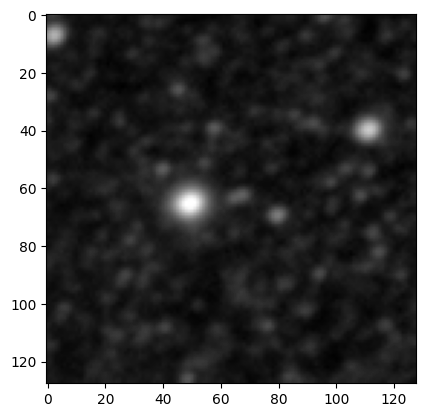

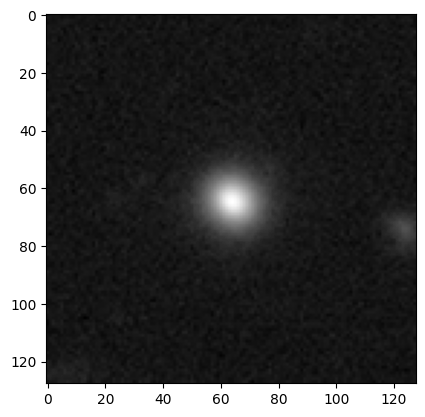

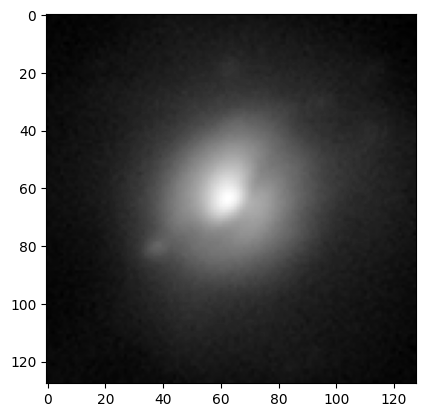

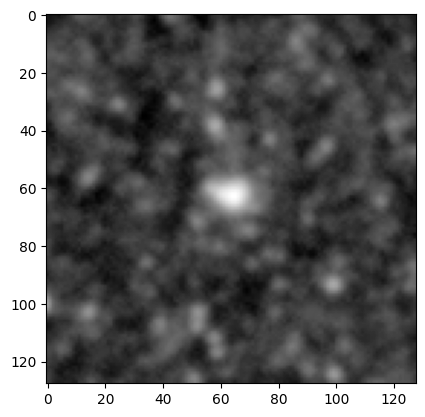

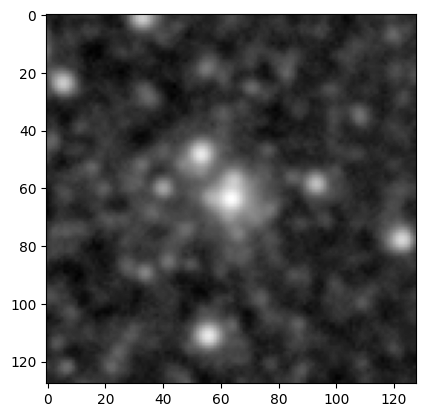

...

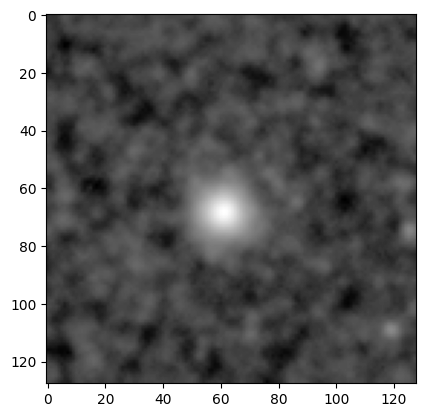

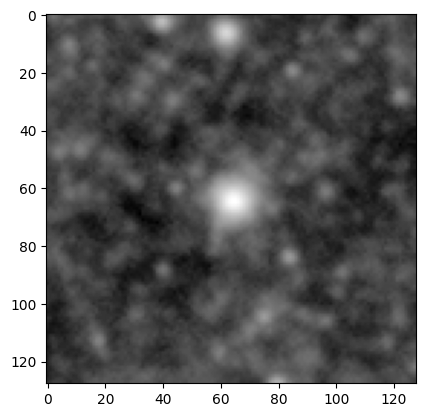

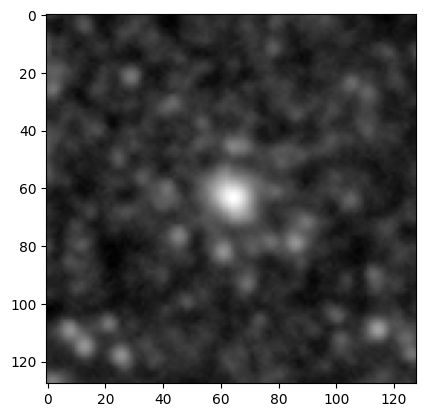

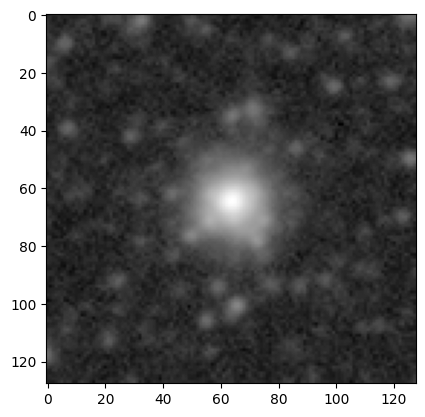

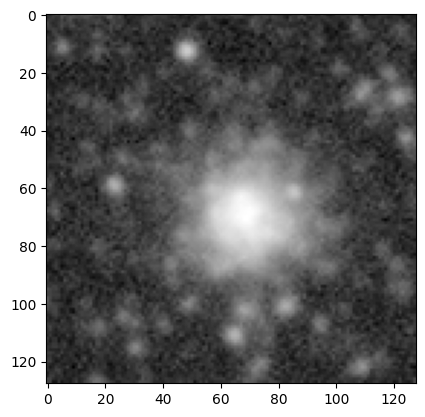

Stop!!


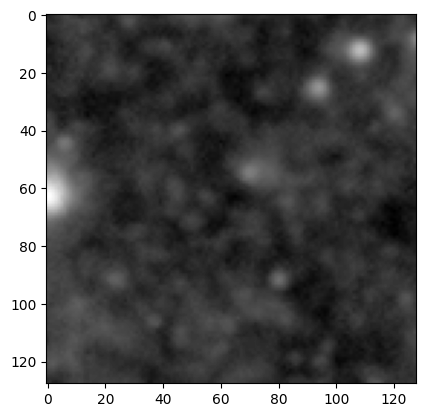

Stop!!


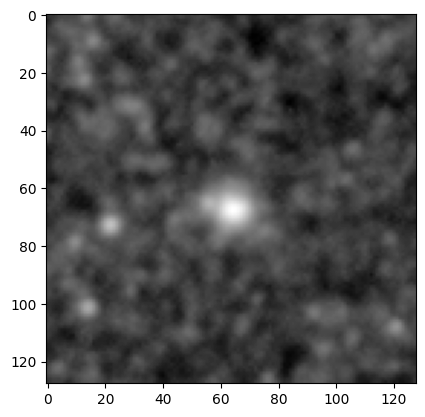

Stop!!


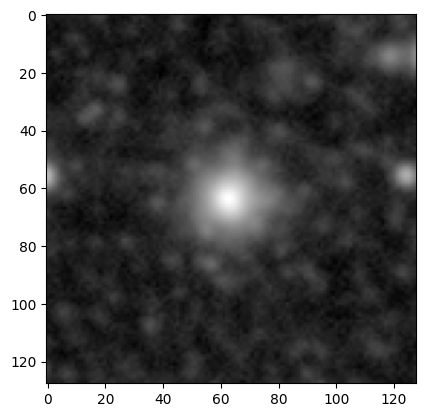

Stop!!


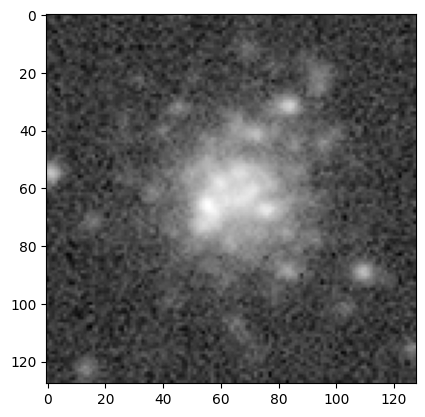

Stop!!


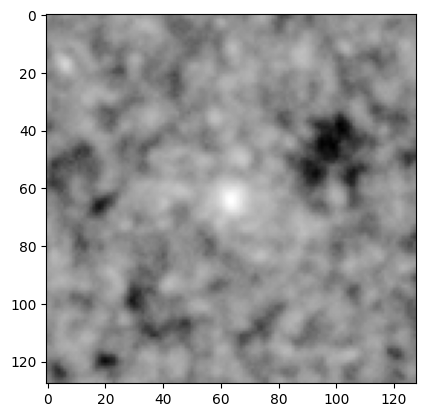

Stop!!


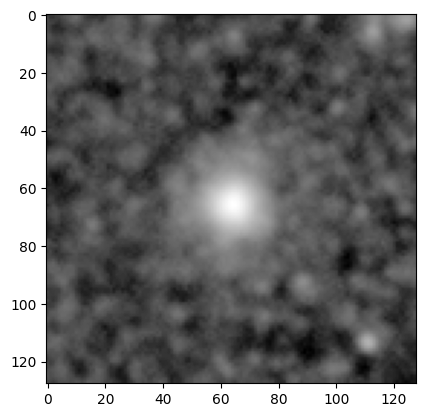

Stop!!


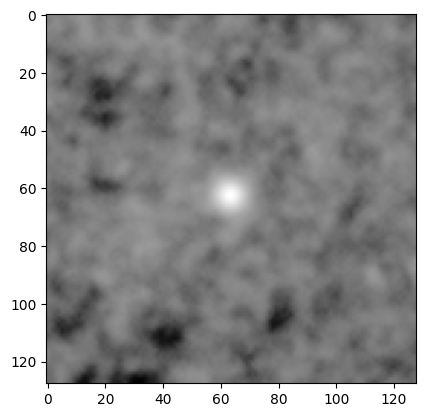

Stop!!


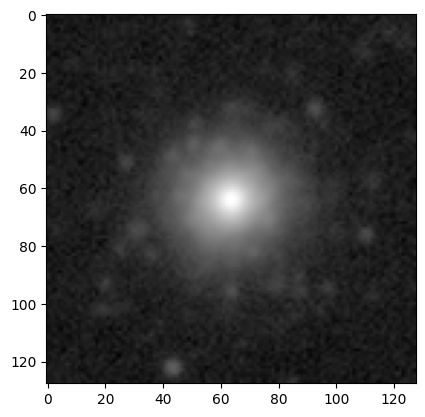

Stop!!


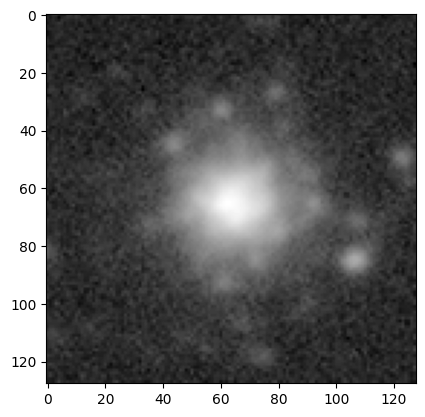

Stop!!


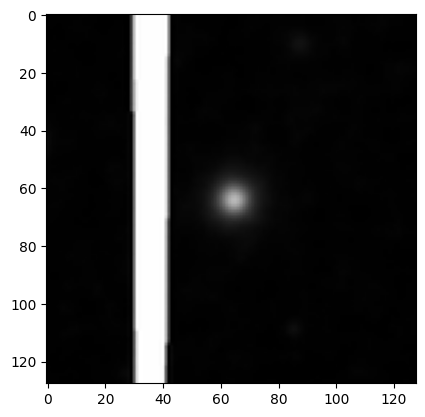

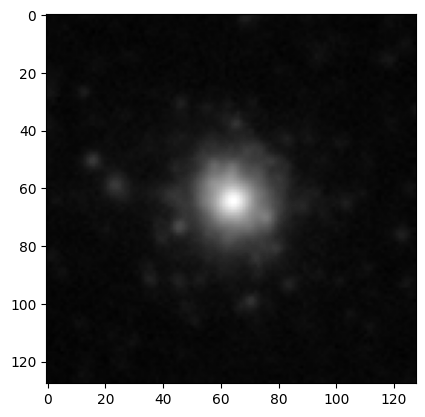

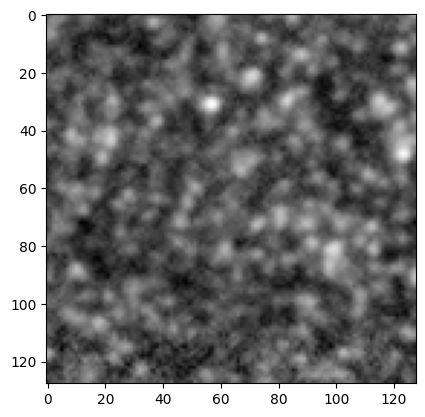

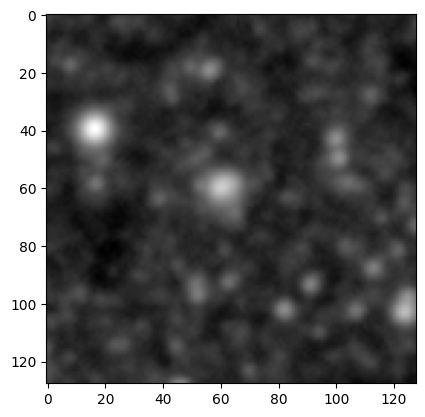

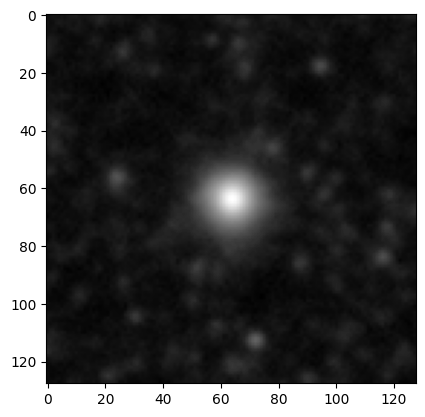

...

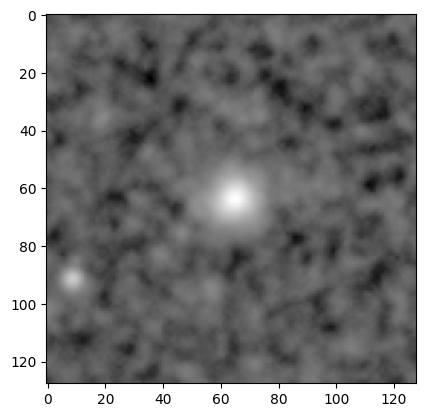

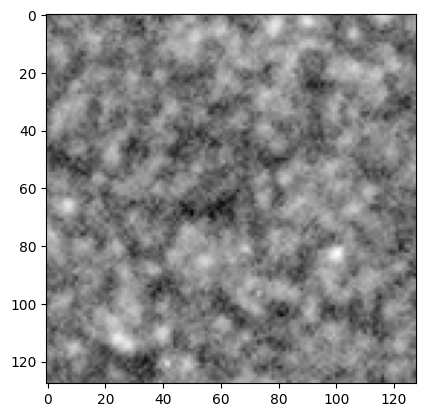

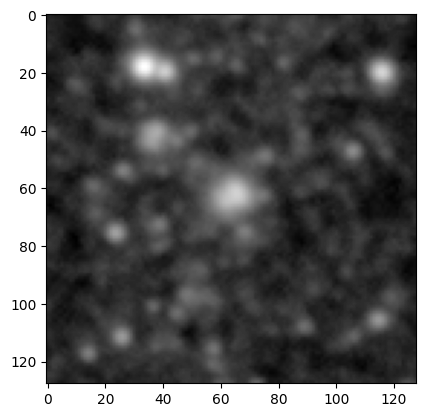

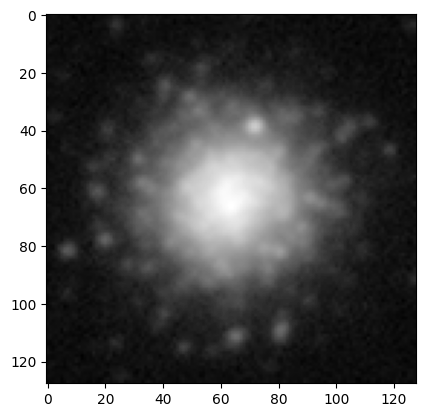

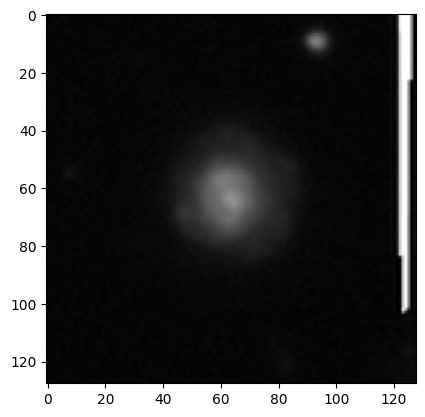

Stop!!


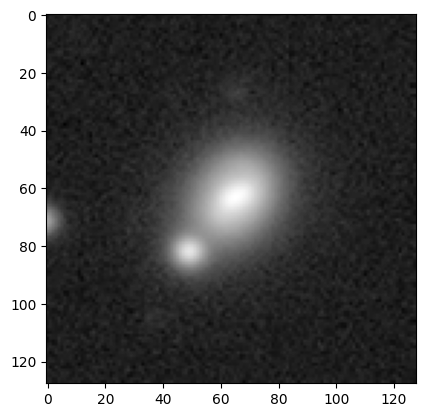

Stop!!


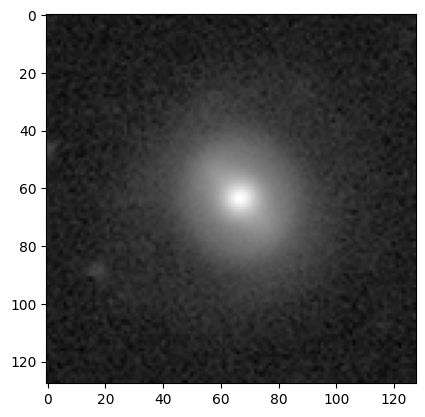

Stop!!


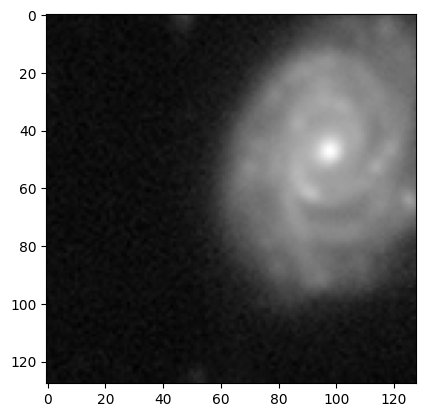

Stop!!


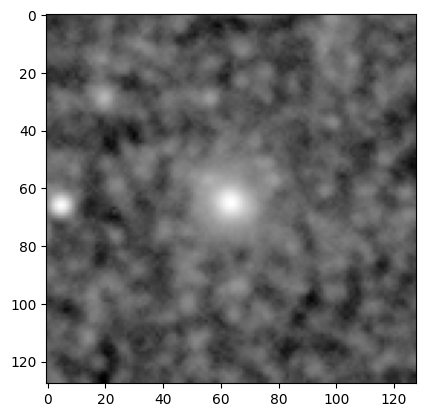

Stop!!


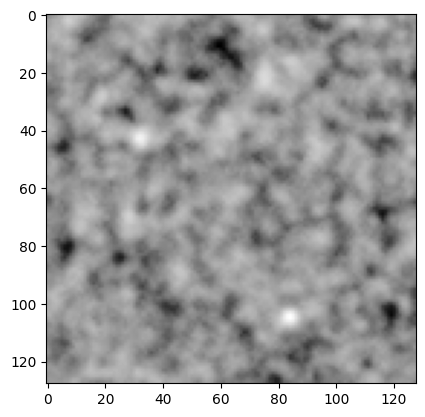

Stop!!


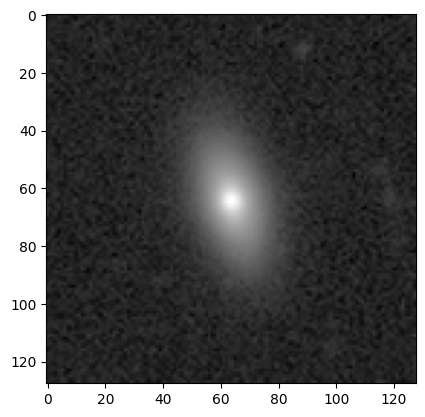

Stop!!


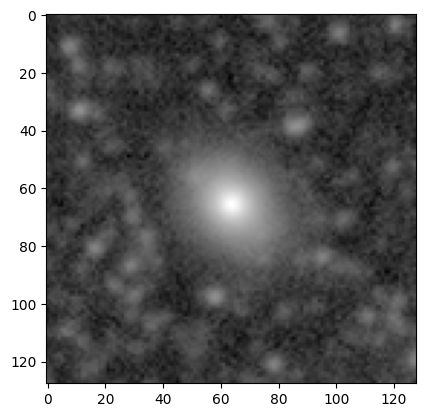

Stop!!


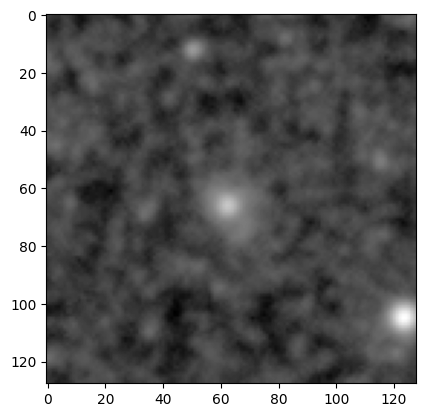

Stop!!


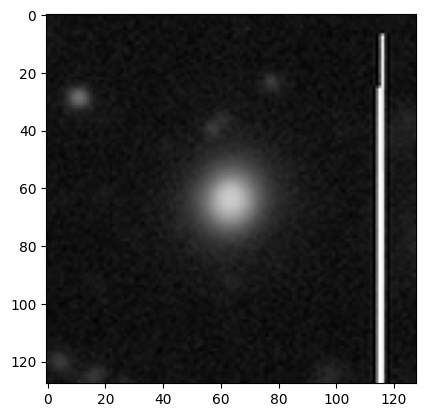

Stop!!


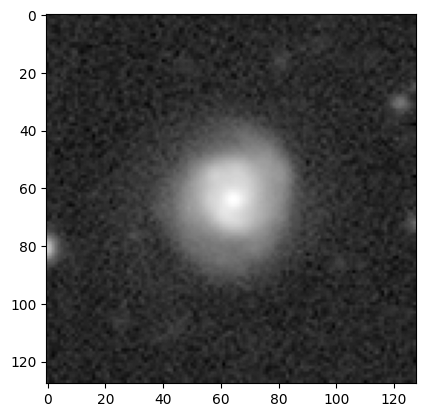

Stop!!


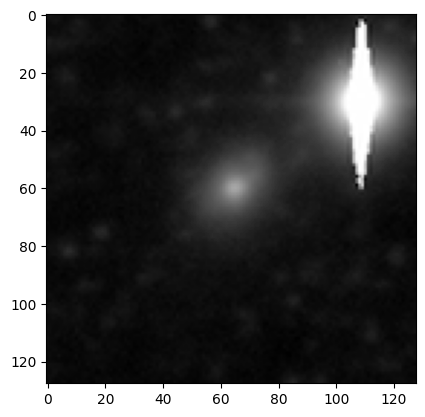

Stop!!


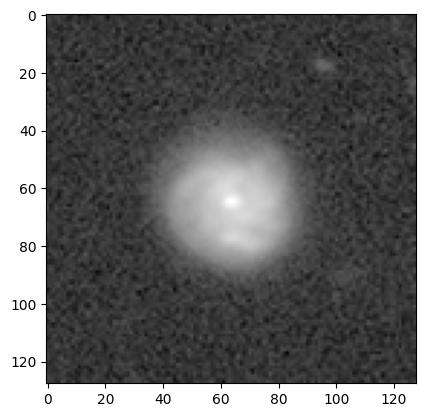

Stop!!


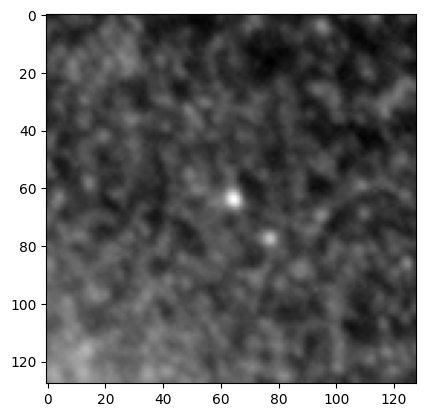

Stop!!


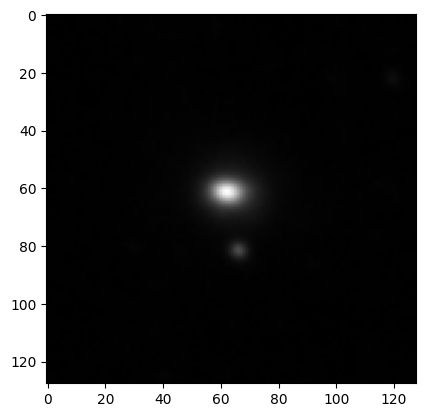

Stop!!


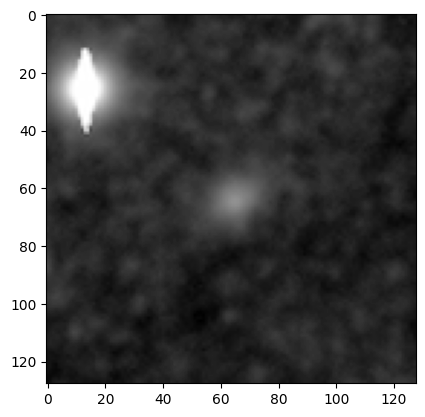

Stop!!


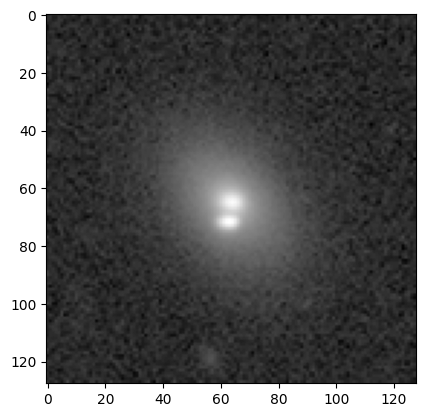

Stop!!


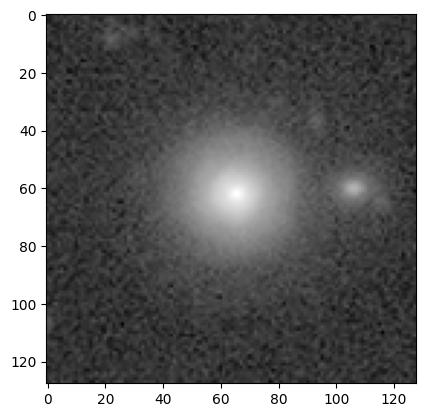

Stop!!


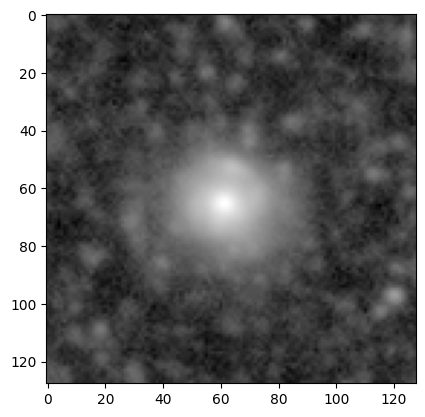

Stop!!


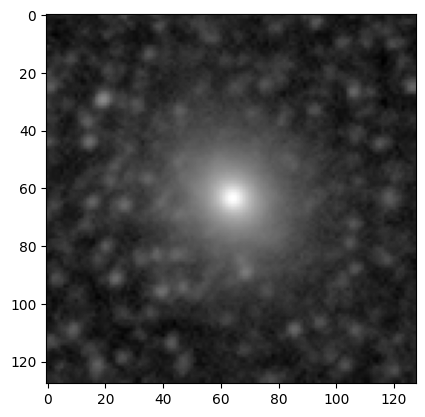

Stop!!


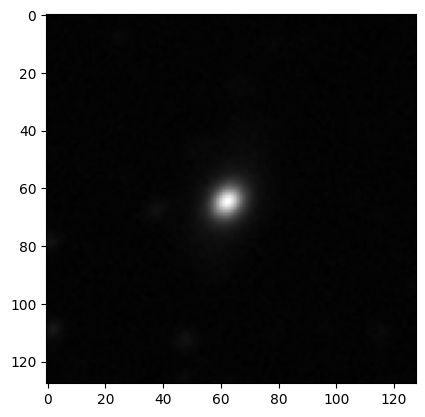

Stop!!


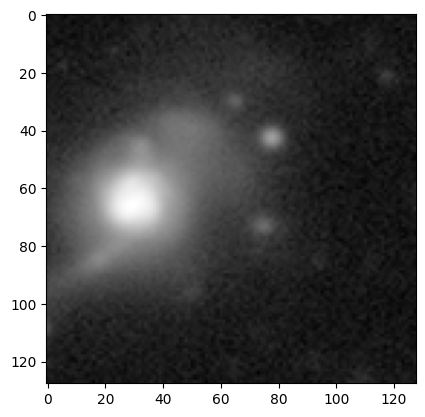

Stop!!


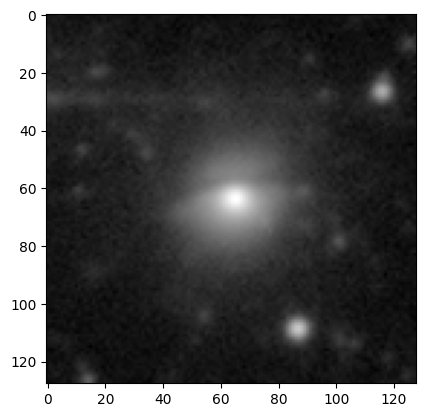

Stop!!


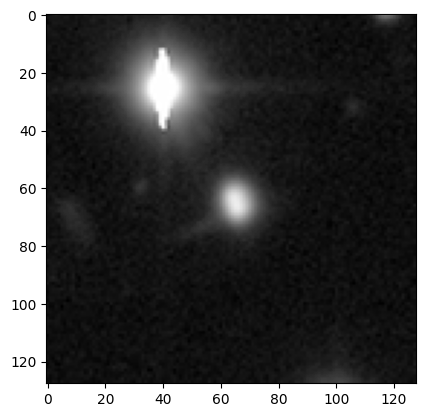

Stop!!


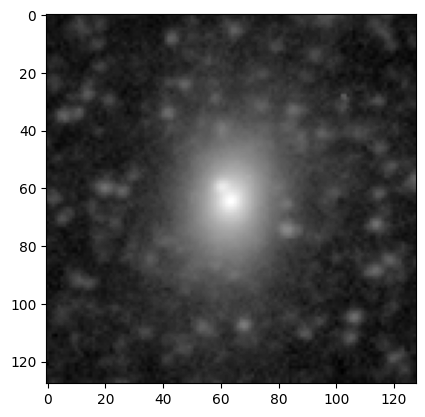

Stop!!


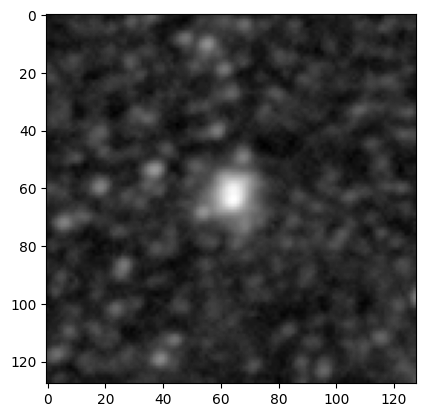

Stop!!


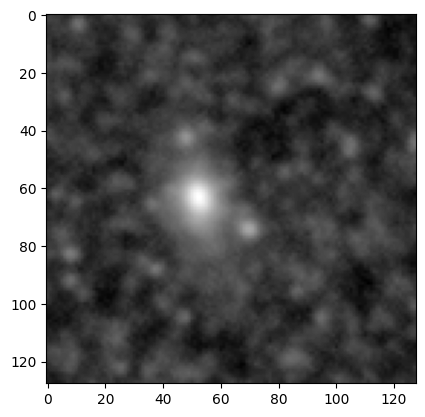

Stop!!


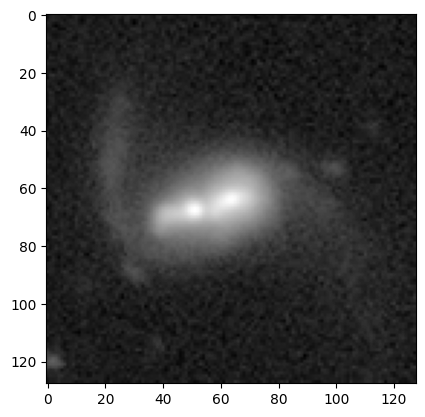

Stop!!


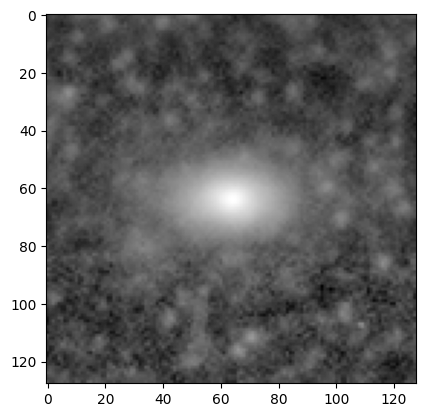

Stop!!


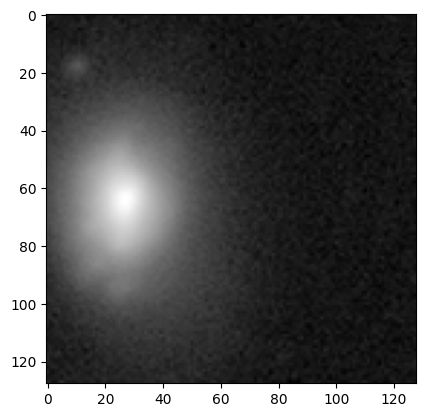

Stop!!


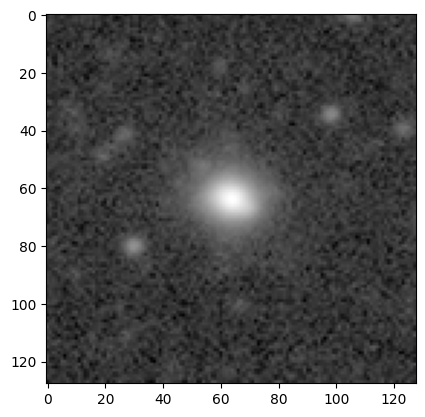

Stop!!


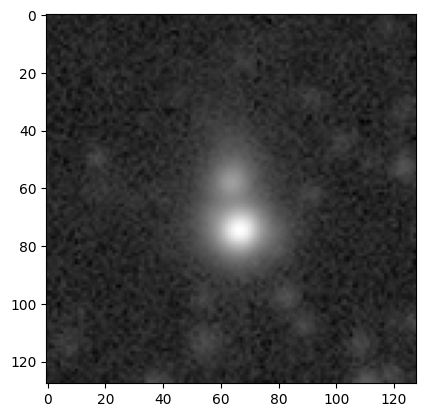

Stop!!


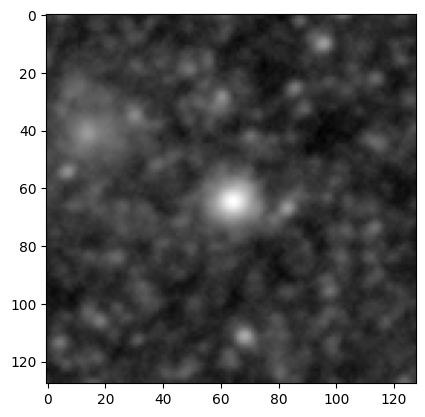

Stop!!


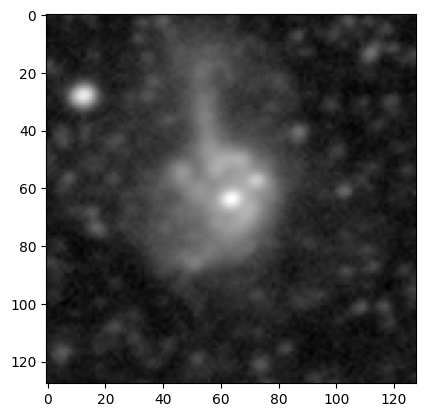

Stop!!


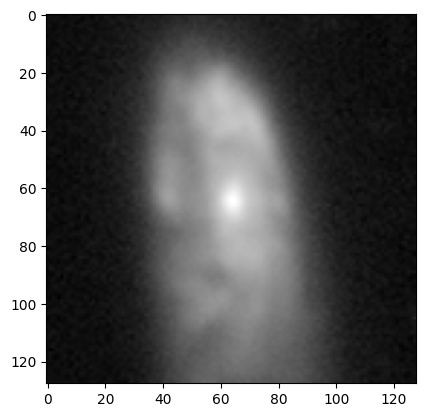

Stop!!


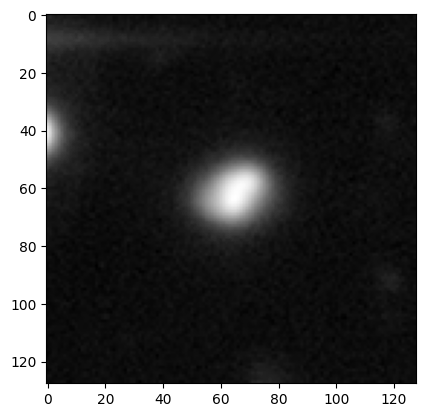

Stop!!


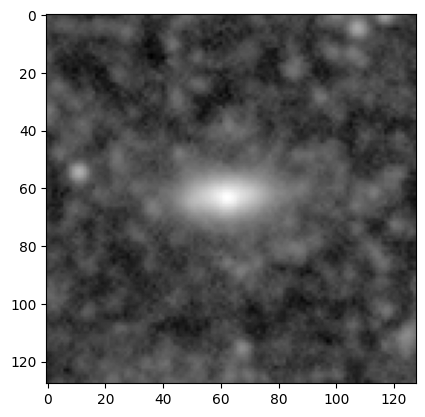

Stop!!


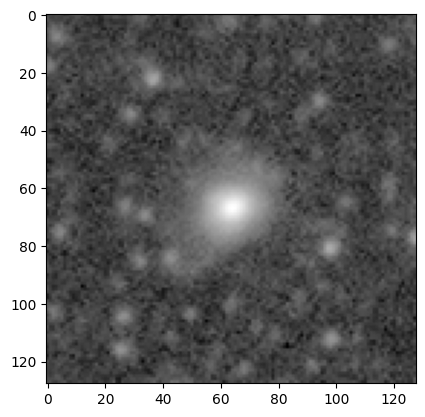

Stop!!


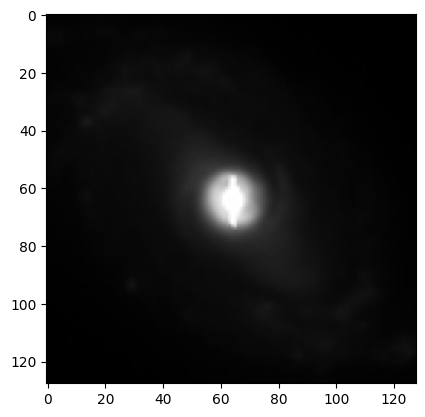

Stop!!


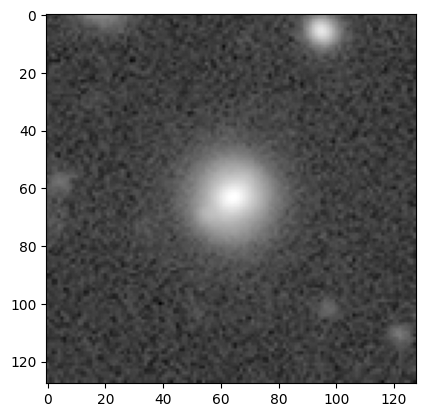

Stop!!


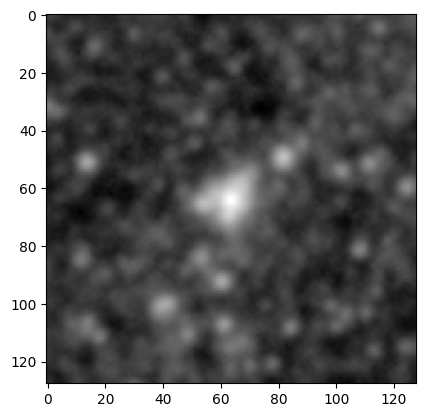

Stop!!


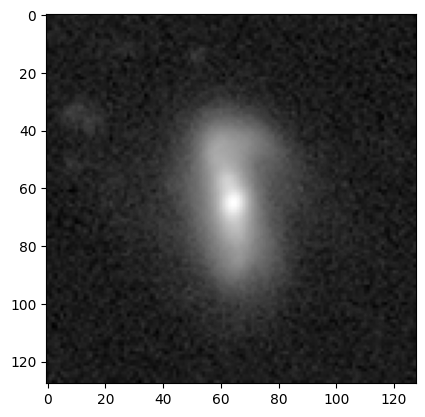

Stop!!


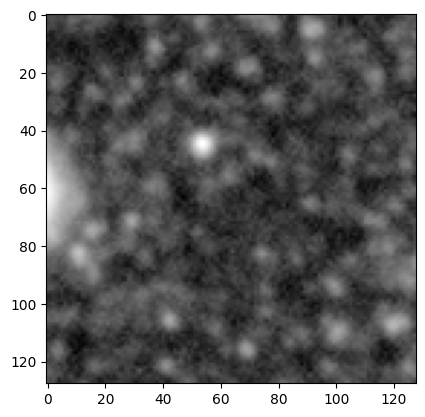

Stop!!


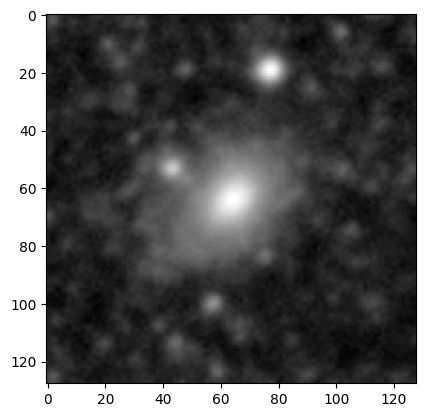

Stop!!


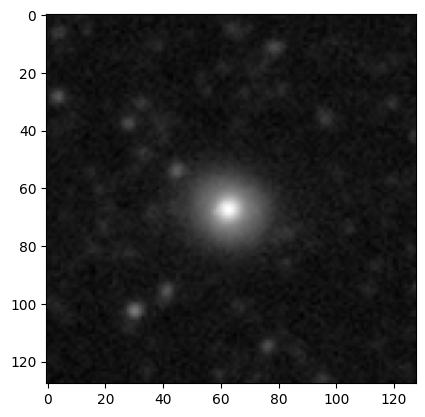

Stop!!


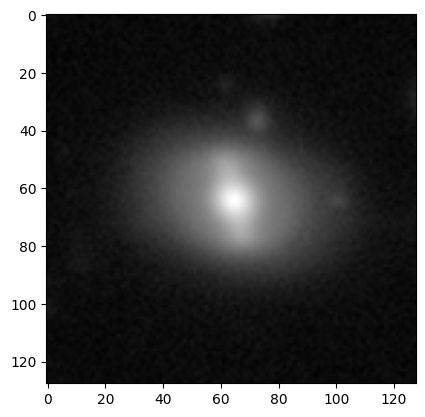

Stop!!


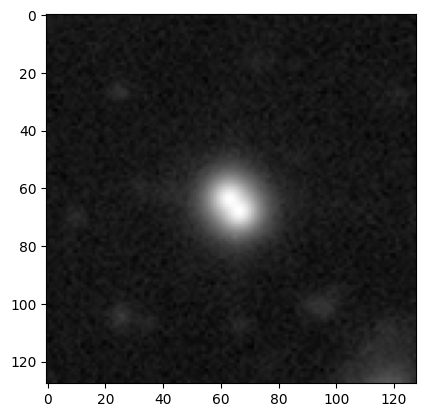

Stop!!


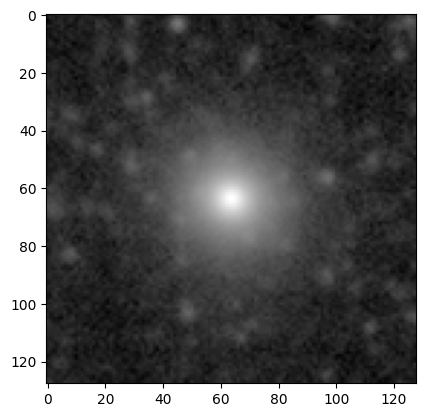

Stop!!


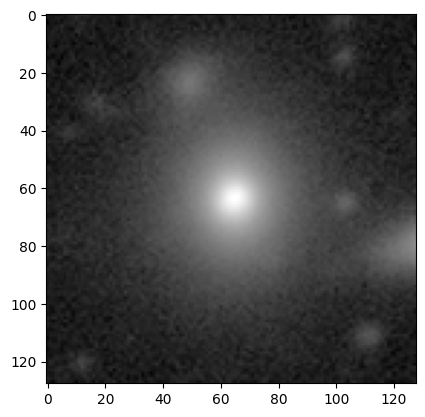

Stop!!


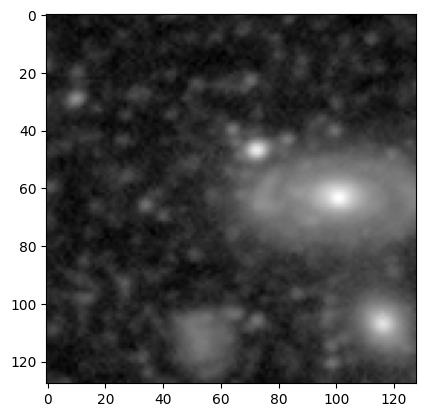

Stop!!


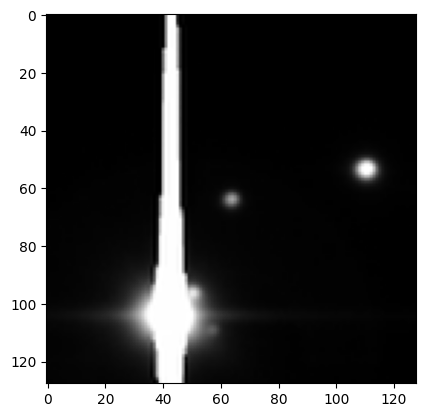

Stop!!


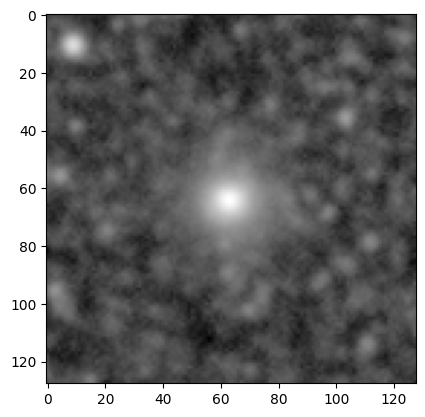

Stop!!


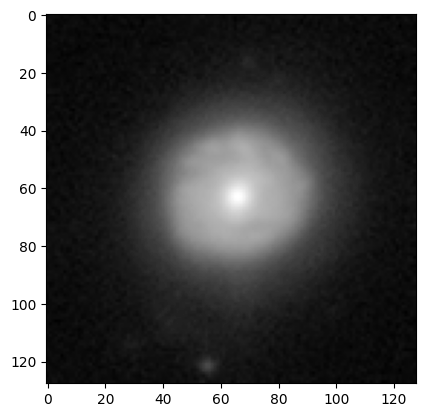

Stop!!


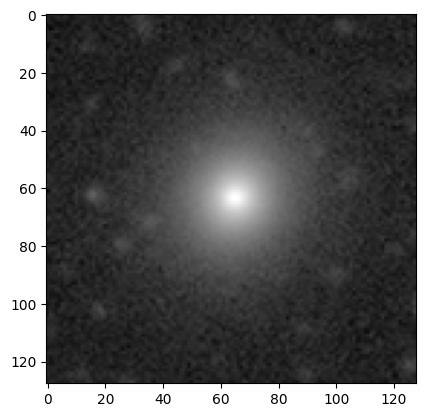

Stop!!


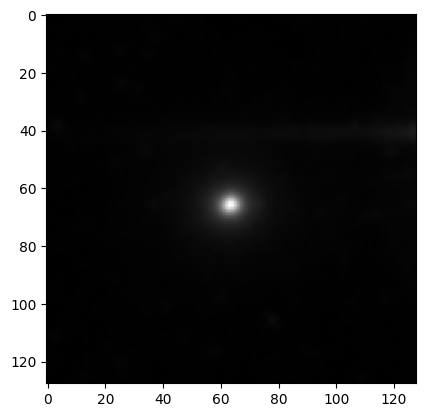

Stop!!


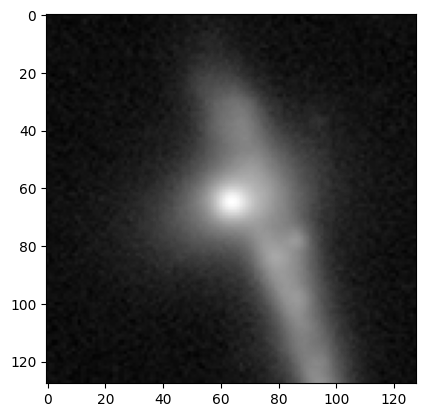

Stop!!


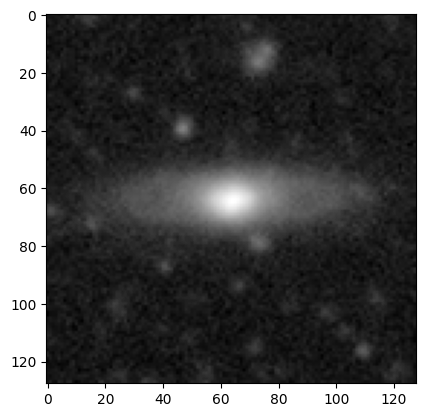

Stop!!


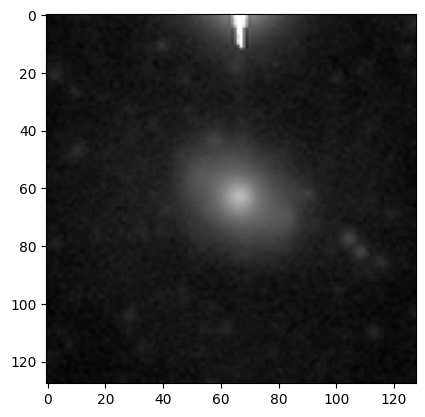

Stop!!


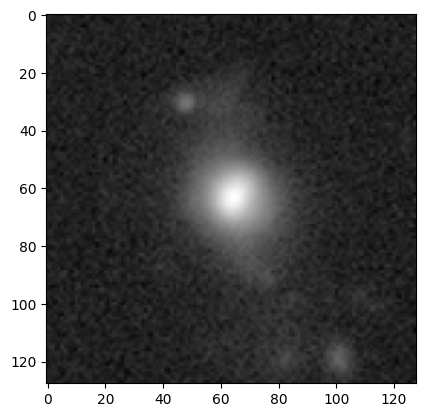

Stop!!


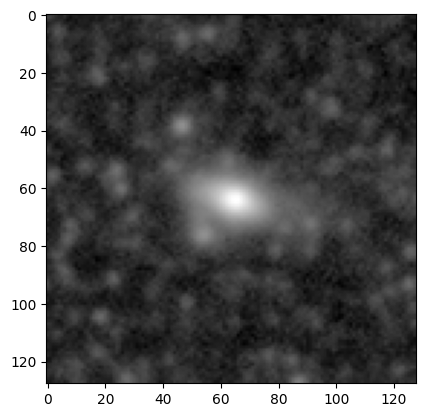

Stop!!
(0.0, 1.0, 1.0, 1.0, 0.0)
(0.0, 0.0, 1.0, 0.0, 1.0)
(0.0, 0.0, 0.0, 0.0, 1.0)
(1.0, 0.0, 0.0, 0.0, 0.0)
(0.0, 1.0, 1.0, 0.0, 1.0)
(1.0, 0.0, 1.0, 1.0, 1.0)
(0.0, 0.0, 0.0, 0.0, 1.0)
(1.0, 0.0, 1.0, 0.0, 0.0)
(0.0, 0.0, 1.0, 0.0, 1.0)
(0.0, 1.0, 0.0, 0.0, 0.0)
(1.0, 0.0, 1.0, 0.0, 1.0)
(1.0, 1.0, 1.0, 1.0, 0.0)
(1.0, 1.0, 1.0, 1.0, 1.0)
(1.0, 0.0, 1.0, 1.0, 1.0)
(1.0, 0.0, 1.0, 0.0, 0.0)
(0.0, 1.0, 1.0, 0.0, 0.0)


In [ ]:
import json
import random
import numpy as np 
from image_utils import encode_image_to_base64


Galaxy_Dir = 'OpenAI-venv/galaxyimages'
GC_Dir = 'OpenAI-venv/gcimages'
Large_Galaxy_Dir = 'OpenAI-venv/LargeGalaxyImages'
Large_GC_Dir = 'OpenAI-venv/fitsgcs copy'
finetuneGC_Dir = 'OpenAI-venv/GCDirFineTune'
finetuneGalaxy_Dir = 'OpenAI-venv/GalaxyDirFineTune'
output = 'OpenAI-venv/data.json'
output2= 'OpenAI-venv/finetuningdata.jsonl'
data = []
finetunedata = []

data.extend(load_images(Large_Galaxy_Dir, 40, "Testing", 0))
finetunedata.extend(load_images(finetuneGC_Dir, 60, "Finetune", 1))
data.extend(load_images(Large_GC_Dir, 40, "Testing", 1))
finetunedata.extend(load_images(finetuneGalaxy_Dir, 60, "Finetune", 0))

batch_labels = list(np.zeros(40))
batch_labels.extend(list(np.ones(40)))
zipped_data = list(zip(data, batch_labels))
# Shuffle the zipped list
random.shuffle(zipped_data)
random.shuffle(finetunedata)
# Unzip them back into two separate lists
data, batch_labels = zip(*zipped_data)
for i in range(0, len(batch_labels), 5):
    print((batch_labels[i:i+5]))
with open(output, "w") as json_file:
    json.dump(data, json_file, indent=4)
with open(output2, "w") as json_file:
    for data in finetunedata: 
        json_line = json.dumps(data)
        json_file.write(json_line + "\n")

In [5]:
import json
finetunedata = []
finetuneGalaxy_Dir = 'OpenAI-venv/GalaxyDirFineTune'
output = 'OpenAI-venv/data.json'
output2= 'OpenAI-venv/finetuningdata.jsonl'

finetunedata.extend(load_images(finetuneGalaxy_Dir, 60, "Finetune", 0))

def replace_null_image_urls(json_lines, new_urls):
    """
    Replace 'null' image_url values with values from new_urls array.

    Args:
        json_lines (list of str): Each line is a JSON string (like your dataset).
        new_urls (list of str): List of image URLs to insert into null slots.

    Returns:
        list of dict: Modified messages with image_url replaced.
    """
    updated_data = []
    url_index = 0

    for line in json_lines:
        entry = json.loads(line)  # Parse JSON line

        # Search for user messages with null image_url
        for msg in entry['messages']:
            if msg['role'] == 'user' and isinstance(msg['content'], list):
                for item in msg['content']:
                    if item['type'] == 'image_url' and item['image_url'] is None:
                        if url_index < len(new_urls):
                            item['image_url'] = new_urls[url_index]
                            url_index += 1
        updated_data.append(entry)

    return updated_data

with open(output2, "r") as f:
    json_lines = [json.loads(line) for line in f]
    replace_null_image_urls(finetunedata, json_lines)

Stop!!


JSONDecodeError: Expecting ',' delimiter: line 1 column 291 (char 290)

Call the API

In [ ]:
from openai import OpenAI
import json
import os

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY"))


with open("OpenAI-venv/data.json", "r") as data:
    input_data = json.load(data)
    #set my private openai key as environment variable to use here
    batch_size = 5
    for i in range(0, len(input_data), batch_size): 
        #get data for batch to send to api
        batch = input_data[i:i+batch_size]
        messages =[
            {"role": "system", "content": "You are a classifier for astronomical images from the PandAS astronomical survey. Do not use metadata or any external information to classify the images."},
            {"role": "user", "content": f"You will be shown batches of image data of either Globular Clusters (GCs) or Galaxies. The object may not be in centre of frame. A batch can contain 5 images. Please return an array of length 5 with an entry for each image in the batch. Return 1 for GC and 0 For galaxy. do no use the metadata and not give any further information: {json.dumps(batch)}"}
        ]
        response = client.chat.completions.create(model="gpt-4o-mini",
        messages = messages)
        result = response.choices[0].message.content
        print(result)

[1, 0, 0, 0, 1]
[1, 0, 0, 0, 0]
[1, 0, 0, 1, 1]


RateLimitError: Error code: 429 - {'error': {'message': 'Rate limit reached for gpt-4o-mini in organization org-t9emDr7a4OzZW9oDn932OOrM on tokens per min (TPM): Limit 200000, Used 189373, Requested 14069. Please try again in 1.032s. Visit https://platform.openai.com/account/rate-limits to learn more.', 'type': 'tokens', 'param': None, 'code': 'rate_limit_exceeded'}}

In [ ]:
from openai import OpenAI
import json
import os

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY"))


with open("OpenAI-venv/data.json", "r") as data:
    input_data = json.load(data)
    #set my private openai key as environment variable to use here
    batch_size = 5
    for i in range(0, len(input_data), batch_size): 
        #get data for batch to send to api
        batch = input_data[i:i+batch_size]
        if (i < 6):
            message =  {"role": "user", "content": f"You will be shown batches of image data of either Globular Clusters (GCs) or Galaxies. The object may not be in centre of frame. A batch can contain 5 images. The first 2 batches will then contain the correct labels. Use these to help you classify the rest.: {json.dumps(batch)} {data_labels[0:5]}. Do not respond with a message"}
        else: 
            message =  {"role": "user", "content": f"You will now be shown batches of image data of either Globular Clusters (GCs) or Galaxies. The object may not be in centre of frame. A batch can contain 5 images. Please return an array of length 5 with an entry for each image in the batch. Return 1 for GC and 0 For galaxy. do no use the metadata and not give any further information, but do use the first 2: {json.dumps(batch)}"}
        messages =[
            {"role": "system", "content": "You are a classifier for astronomical images from the PandAS astronomical survey. Do not use metadata or any external information to classify the images."}, message
        ]
        response = client.chat.completions.create(model="gpt-4o-mini",
        messages = messages)
        result = response.choices[0].message.content
        print(result)

KeyboardInterrupt: 

Calculate the resulting accuracy 

In [ ]:
from openai import OpenAI
import json
import os

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY"))

# Load dataset
with open("OpenAI-venv/data.json", "r") as data:
    input_data = json.load(data)

batch_size = 5
data_labels = [1, 1, 0, 1, 1]  # Only one few-shot batch now

# Use just **ONE** few-shot example (to save tokens)
few_shot_examples = [
    {"role": "user", "content": f"Batch: {input_data[:batch_size]} → Labels: {data_labels}"},
    {"role": "assistant", "content": f"{data_labels}"}
]

# Process remaining batches
for i in range(1, len(input_data) // batch_size):  
    batch = input_data[i * batch_size : (i + 1) * batch_size]

    # Remove JSON formatting to **reduce token bloat**
    batch_text = str(batch)  # Converts list of dicts to a compact string

    # Reset messages per batch
    messages = [
        {"role": "system", "content": "You are a classifier for astronomical images from the PandAS survey. Do not use metadata or external sources."}
    ] + few_shot_examples + [
        {"role": "user", "content": f"Batch {i+1}: {batch_text} → The object may not be in centre of frame. A batch can contain 5 images. Please Return a floating point number between 0 and 1 as a propobility for each image, with 0 being a Galaxy and 1 a GC. Do not add any text explaining reasoning."}
    ]

    # Call API with a fixed context size
    response = client.chat.completions.create(
        model="gpt-4o-mini",
        messages=messages,
        max_tokens=400  # Prevent excessive output
    )

    result = response.choices[0].message.content
    print(result)

[0.2, 0.4, 0.1, 0.3, 0.5]
[0.2, 0.1, 0.7, 0.4, 0.3]
[0.1, 0.2, 0.9, 0.2, 0.3]
[0.2, 0.1, 0.6, 0.3, 0.4]


RateLimitError: Error code: 429 - {'error': {'message': 'Rate limit reached for gpt-4o-mini in organization org-t9emDr7a4OzZW9oDn932OOrM on tokens per min (TPM): Limit 200000, Used 174790, Requested 32829. Please try again in 2.285s. Visit https://platform.openai.com/account/rate-limits to learn more.', 'type': 'tokens', 'param': None, 'code': 'rate_limit_exceeded'}}

In [1]:
correct = 0
incorrect = 0
def myround(num):
    if num<0.5:
        return 0.0
    else: 
        return 1.0
    
array2 = [0,0,0,0,0,0.2, 0.4, 0.1, 0.3, 0.5,0.2, 0.1, 0.7, 0.4, 0.3,0.1, 0.2, 0.9, 0.2, 0.3,0.2, 0.1, 0.6, 0.3, 0.4]
for i in range(5, 25, 5):
    for j in range(0,5):
        if batch_labels[i+j] == myround(array2[i+j]):
            correct += 1 
        else: 
            incorrect += 1 
print(correct)
print(incorrect)


NameError: name 'batch_labels' is not defined

[1, 1, 0, 1, 1]

In [ ]:
from openai import OpenAI
import json
import os

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY"))

# Load dataset
with open("OpenAI-venv/data.json", "r") as data:
    input_data = json.load(data)

batch_size = 5
data_labels = [1, 1, 0, 1, 1]  # Only one few-shot batch now

# Use just **ONE** few-shot example (to save tokens)
few_shot_examples = [
    {"role": "user", "content": f"Batch 1: {input_data[:batch_size]} → Labels: {data_labels}"},
    {"role": "assistant", "content": f"{data_labels}"}
]

# Process remaining batches
for i in range(1, len(input_data) // batch_size):  
    batch = input_data[i * batch_size : (i + 1) * batch_size]

    # Remove JSON formatting to **reduce token bloat**
    batch_text = str(batch)  # Converts list of dicts to a compact string

    # Reset messages per batch
    messages = [
        {"role": "system", "content": "You are a classifier for astronomical images from the PandAS survey. Do not use metadata or external sources."}
    ] + few_shot_examples + [
        {"role": "user", "content": f"Batch {i+1}: {batch_text} → The object may not be in centre of frame. A batch can contain 5 images. Please return an array of length 5 with an entry for each image in the batch. Return 1 for GC and 0 For galaxy."}
    ]

    # Call API with a fixed context size
    response = client.chat.completions.create(
        model="gpt-4o-mini",
        messages=messages,
        max_tokens=50  # Prevent excessive output
    )

    result = response.choices[0].message.content
    print(result)
    

In [8]:
import json

input_file = "OpenAI-venv/finetuningdata.jsonl"
output_file = "OpenAI-venv/cleaned_finetuningdata.jsonl"

with open(input_file, "r") as infile, open(output_file, "w") as outfile:
    for i, line in enumerate(infile, 1):
        try:
            line = line.strip()
            if not line:
                continue
            json.loads(line)  # Try parsing it
            outfile.write(line + "\n")  # Write only if valid
        except json.JSONDecodeError as e:
            print(f"❌ Skipping line {i} due to JSON error: {e}")

In [45]:
import json

# Step 1: Load URLs
with open("GCtest_urls.txt", "r") as f:
    input_data = [line.strip() for line in f if line.strip()]
with open("GalaxyTest_urls.txt", "r") as f:
    input_data = input_data + [line.strip() for line in f if line.strip()]

# Step 2: Create batch-formatted lines
with open("batch_requestsB.jsonl", "w") as out:
    for i, url in enumerate(input_data):
        request = {
            "custom_id": f"img-{i+1:03}",
            "method": "POST",
            "url": "/v1/chat/completions",
            "body": {
                "model": "gpt-4o",
                "messages": [
                    {"role": "system", "content": "You are a classifier for astronomical images from the PandAS survey."},
                    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy"},
                    {"role": "user", "content": [{"type": "image_url", "image_url": {"url": url}}]}
                ]
            }
        }
        out.write(json.dumps(request) + "\n")

print("✅ batch_requestsB.jsonl created successfully!")

✅ batch_requestsB.jsonl created successfully!


In [54]:
import json
import os
from openai import OpenAI
import time
few_shot_examples = [
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/mEutkVG.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/5h7hW4k.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/yR93oFP.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/6ERH5tT.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/Pxchc7p.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/2TRVq3K.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/IiXZHRR.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/i9N1tGf.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/VgTbnmR.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/MBE8jFB.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/Qyoehq1.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/5wMYQfo.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/gHWQhAr.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/JlyYITX.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/1UVdB3I.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/mJYfK65.png"},
    {"role": "assistant", "content": "0"},
    {"role": "user", "content": "Return 1 for a Globular Cluster or 0 for a Galaxy. Image: https://i.imgur.com/ruZ2jgh.png"},
    {"role": "assistant", "content": "0"},
]


client = OpenAI(api_key=os.getenv("OPENAI_API_KEY"))
guesses = []
# Load batch_requests.jsonl and parse each request
with open("batch_requestsB.jsonl", "r") as f:
    for i, line in enumerate(f):
        entry = json.loads(line.strip())

        # Extract the body (this is the actual Chat Completion request)
        body = entry["body"]

        try:
            # Send the request to OpenAI's chat completions endpoint
            response = client.chat.completions.create(
                model=body["model"],
                messages= few_shot_examples+body["messages"]
            )

            # Extract and print result
            result = response.choices[0].message.content
            print(f"\n✅ Batch {i+1} response:")
            print(result)
            guesses.append(result)


        except Exception as e:
            print(f"❌ Error in batch {i+1}: {e}")
            time.sleep(5)  # optional backoff

print(guesses)


✅ Batch 1 response:
1

✅ Batch 2 response:
0

✅ Batch 3 response:
1

✅ Batch 4 response:
1

✅ Batch 5 response:
1

✅ Batch 6 response:
1

✅ Batch 7 response:
1

✅ Batch 8 response:
0

✅ Batch 9 response:
1

✅ Batch 10 response:
1

✅ Batch 11 response:
1

✅ Batch 12 response:
1

✅ Batch 13 response:
1

✅ Batch 14 response:
1

✅ Batch 15 response:
1

✅ Batch 16 response:
1

✅ Batch 17 response:
1

✅ Batch 18 response:
1

✅ Batch 19 response:
1

✅ Batch 20 response:
1

✅ Batch 21 response:
0

✅ Batch 22 response:
0

✅ Batch 23 response:
1

✅ Batch 24 response:
1

✅ Batch 25 response:
0

✅ Batch 26 response:
1

✅ Batch 27 response:
1

✅ Batch 28 response:
1

✅ Batch 29 response:
1

✅ Batch 30 response:
1

✅ Batch 31 response:
1

✅ Batch 32 response:
0

✅ Batch 33 response:
1

✅ Batch 34 response:
1

✅ Batch 35 response:
1

✅ Batch 36 response:
0

✅ Batch 37 response:
1

✅ Batch 38 response:
0

✅ Batch 39 response:
1

✅ Batch 40 response:
1

✅ Batch 41 response:
1

✅ Batch 42 response:
1



In [55]:
output = output = ['1', '0', '0', '1', '1', '0', '0', '0', '1', '1', '1', '1', '0', '0', '1', '0', '1', '0', '1', '1', '0', '0', '1', '1', '0', '1', '1', '0', '0', '1', '1', '0', '0', '0', '0', '0', '0', '0', '1', '1', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '0']
output = guesses
galaxy_corr = 0
gc_corr = 0
for x in range (0,79):
    if x < 40: 
        if output[x] == '1':
            gc_corr += 1 
    else: 
        if output[x] == '0':
            galaxy_corr += 1 
print("accuracy: " + str(gc_corr+galaxy_corr / 0.8) + "%")
print("recall: " + str(2 * gc_corr / 0.8) + "%")

accuracy: 59.5%
recall: 80.0%


ModuleNotFoundError: No module named 'sklearn'